<a href="https://colab.research.google.com/github/catherineGit/Project-2/blob/main/project_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install yfinance --upgrade --no-cache-dir
!pip install pandas-datareader
!pip install finance-datareader
!pip install hvplot
!pip install holoviews
!pip install pystan
!pip install prophet
!pip install pandas-ta

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


import yfinance as yf
from pandas_datareader import data as pdr
import FinanceDataReader as fdr


import warnings
warnings.filterwarnings('ignore')

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

import os
import shutil

import hvplot.pandas
import holoviews as hv
from prophet import Prophet

import tensorflow as tf
from tensorflow.keras import regularizers
from tensorflow.keras.optimizers import AdamW
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout


from google.colab import files
uploaded = files.upload()
import modified_pmt as pmt



from datetime import datetime, timedelta
import pandas_ta as ta

from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ReduceLROnPlateau

Saving modified_pmt.py to modified_pmt (3).py


In [3]:
def create_dataframe(stock = '^GSPC', start = '2009-06-01', end = '2022-12-31'):
    # Some data are only given monthly, so the data may not exist at the start date. Therefore, set start date to 6 months before the desired start date first, then will slice the data after.
    date = datetime.strptime(start, '%Y-%m-%d')
    date = date - timedelta(days = 100)
    date = date.strftime('%Y-%m-%d')

    # Loading S&P 500 data
    df = fdr.DataReader(stock, start = date, end = end)

    # Creating list of indexes or commodities that we think are important
    indexes = {'FRED:M2SL':'M2', 'FRED:DGS10': '10_year_treasury', 'FRED:DTB3': '3_months_treasury','FRED:CSUSHPINSA': 'Shiller_index', 'FRED:FEDFUNDS': 'Fed_fund_effective_rate', 'FRED:UNRATE': 'Unemployment', 'FRED:DSPIC96': 'Disposable_income', 'FRED:GDP': 'GDP', 'FRED:CPIAUCSL': 'CPI', 'FRED:INDPRO': 'Industrial_production', 'FRED:TOTCI': 'Commercial_loans'}
    tickers = {'GC=F': 'Gold', 'HG=F': 'Copper', 'DX=F': 'US_dollar', 'CL=F': 'Crude_oil', 'VIX': 'VIX', 'ZW=F': 'Wheat'}

    # Loading indexes and commidities
    for tkrs, name in tickers.items():
      dataframe = fdr.DataReader(tkrs, start = start, end = end)[['Adj Close']]
      dataframe.columns = [name]
      df= df.join(dataframe)
    for indx, name in indexes.items():
      dataframe = fdr.DataReader(indx, start = start, end = end)
      dataframe.columns = [name]
      df = df.join(dataframe)

    # Filling N/A values
    df.fillna(method = 'ffill', inplace = True)
    df.fillna(0, inplace = True)
    # Slicing data to desired start date
    df = df[start:]
    return df


def sim_df_creator(train_df, test_df, num_of_samples = 4, kind = 'median'):

    # Creating 2 different dataframes. median_df will create median values of all the simulations.
    # Samples_df will create average of 10 simulations (more volatile)
    median_df = pd.DataFrame()
    samples_df = pd.DataFrame()
    train_df_sliced = train_df.iloc[round(train_df.shape[0]/2):,:]
    # Running simulation for each features for the same duration as test data
    # Can run it to get simulation data for 'median', 'percentile_1' for lower boundary, and 'percentile_2' for upper boundary
    for i in test_df.columns:
      temp_df = pmt.mc_sim(pd.DataFrame(train_df_sliced[i]), [1], test_df.shape[0], 500, kind = 'visualize_ci')
      kind_df = temp_df[[kind]]
      samp_df = pd.DataFrame(temp_df.iloc[:,0:num_of_samples].mean(axis = 1), columns = [i])
      median_df = pd.concat([median_df, kind_df], axis = 1)
      samples_df = pd.concat([samples_df, samp_df], axis = 1)

    median_df.columns = train_df.columns.tolist()


    for i, val in enumerate(train_df.columns.tolist()):
      median_df[val] = median_df[val] * train_df.iloc[-1:, i][0]
      samples_df[val] = samples_df[val] * train_df.iloc[-1:, i][0]

    median_df.index = test_df.index
    samples_df.index = test_df.index

    return median_df, samples_df

def train_test_split_ts(df, train_pct, val_pct = 0):
    # Divide whole dataframe into train, validation, and test sets
    # Test data is automatically calculated by 'whole data - train data - validation data'
    period_list = []
    total_rows = df.shape[0]
    period_list.append(round(total_rows * train_pct))
    period_list.append(round(total_rows * (train_pct + val_pct)))
    return period_list



In [4]:

def technical_indicators(OHLCV_df):
    # Daily Avg Price
    OHLCV_df['avg_price'] = OHLCV_df.ta.ohlc4()
    # Simple Moving Avg 20Days
    OHLCV_df['sma_20'] = OHLCV_df.ta.sma(length=20)
    # Exponential Moving Avg 50Days
    OHLCV_df['ewma_50'] = OHLCV_df.ta.ema(length=50)
    # VWAP modified to use Annual cummulative sum
    OHLCV_df['typical_price'] = (OHLCV_df['High']+OHLCV_df['Low']+OHLCV_df['Close'])/3
    OHLCV_df['vw_typical_price'] = OHLCV_df['typical_price']*OHLCV_df['Volume']
    OHLCV_df['vwap_annual'] = OHLCV_df.groupby(OHLCV_df.index.year)['vw_typical_price'].cumsum() / OHLCV_df.groupby(OHLCV_df.index.year)['Volume'].cumsum()
    # RSI Momemtum Indicator 14Days
    OHLCV_df['rsi_14'] = OHLCV_df.ta.rsi()
    # MACD Momentum Indicator
    OHLCV_df[['ewma_12', 'ewma_26', 'MACD_signal']] = OHLCV_df.ta.macd()
    # Bolinger Bands %B Indicator
    OHLCV_df[['BB_lower','BB_middle','BB_upper','BBP','BB%B']]= OHLCV_df.ta.bbands()
    # On-Balance Volume in Millions
    OHLCV_df['OBV_in_million'] = OHLCV_df.ta.obv()/1000000
    # Average Directional Index 14Days
    OHLCV_df[['adx_14','dmp_14','dmn_14']] = OHLCV_df.ta.adx()
    # Dropping trivial Columns
    OHLCV_append_df = OHLCV_df.drop(columns = ['typical_price','vw_typical_price','Volume',
                                               'BBP','dmp_14','dmn_14']).dropna()
    return(OHLCV_append_df)

In [5]:
master_df = create_dataframe(start = '2010-01-01', end = '2021-01-01')

## 1. Using K Cluster Means and correlation heatmap to find similar features

In [6]:
classifier_df = master_df.drop(['Open', 'High', 'Low', 'Volume', 'Adj Close'], axis = 1)
classifier_df = classifier_df.rename(columns={'Close': 'S&P 500'})

Text(0.5, 1.0, 'Inertia vs. number of clusters')

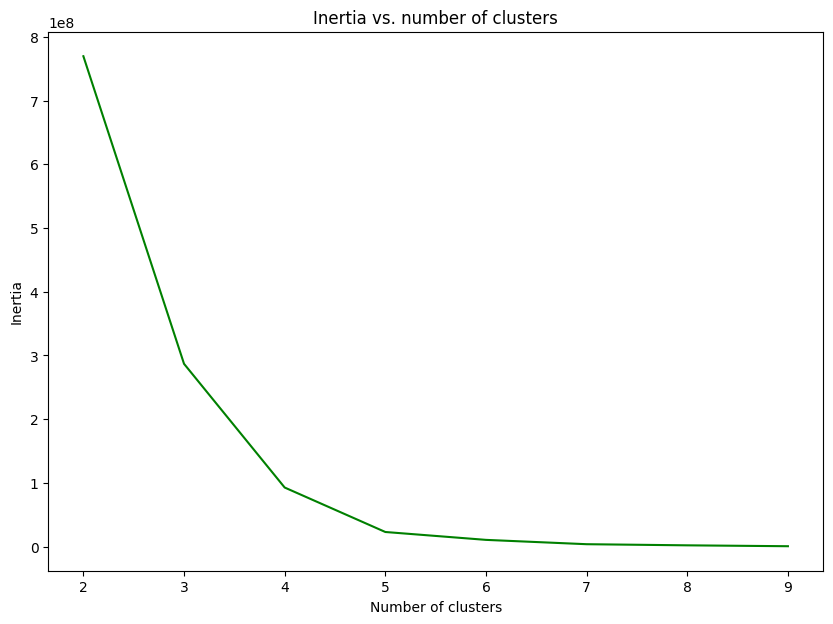

In [7]:
# Finding the error terms (inertia) based on number of clusters

classifier_df = classifier_df.T

num_of_clusters = range(2,10)
inertia = []

for i in num_of_clusters:
  clusters = KMeans(i)
  clusters.fit(classifier_df)
  inertia.append(clusters.inertia_ / 100)

table = pd.DataFrame({'Number of clusters': num_of_clusters, "Inertia": inertia})
plt.figure(figsize = (10,7))
plt.plot(table['Number of clusters'], table['Inertia'], color = 'g')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.title('Inertia vs. number of clusters')

Text(0.5, 1.0, 'Number of securities that belong to each cluster')

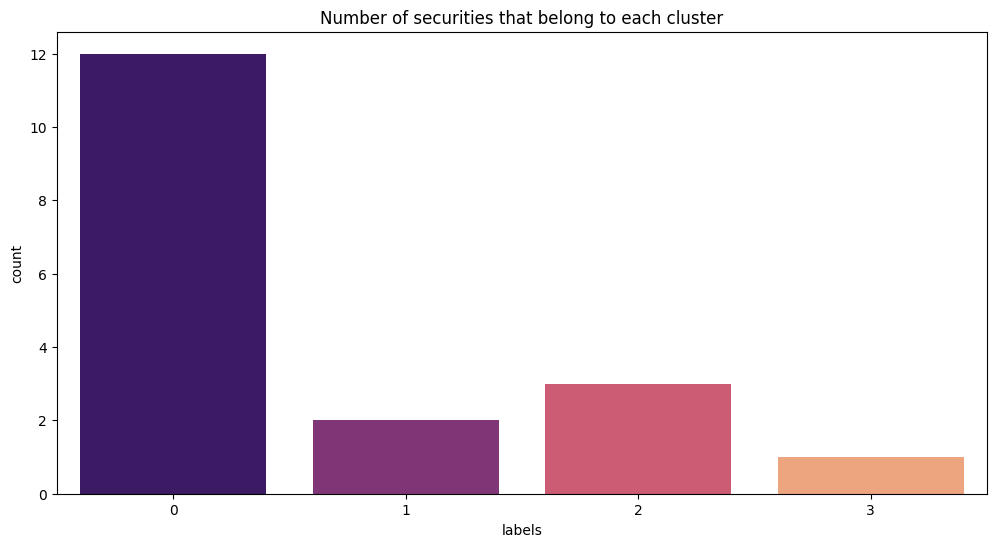

In [8]:
# 4 clusters look reasonable so will choose 4 as number of clusters
clusters = KMeans(4)
clusters.fit(classifier_df)
clusters.labels_

clustered_result = pd.DataFrame({'tickers': classifier_df.index, 'labels': clusters.labels_})
clustered_result.sort_values('labels')
plt.figure(figsize = (12,6))
sns.countplot(x = 'labels', data = clustered_result, palette = 'magma')
plt.title('Number of securities that belong to each cluster')

In [9]:
clustered_result.sort_values('labels')

,tickers,labels
8,10_year_treasury,0
15,CPI,0
2,Copper,0
3,US_dollar,0
4,Crude_oil,0
5,VIX,0
6,Wheat,0
16,Industrial_production,0
9,3_months_treasury,0
10,Shiller_index,0


Text(0.5, 1.0, 'Heatmap of all the securities used')

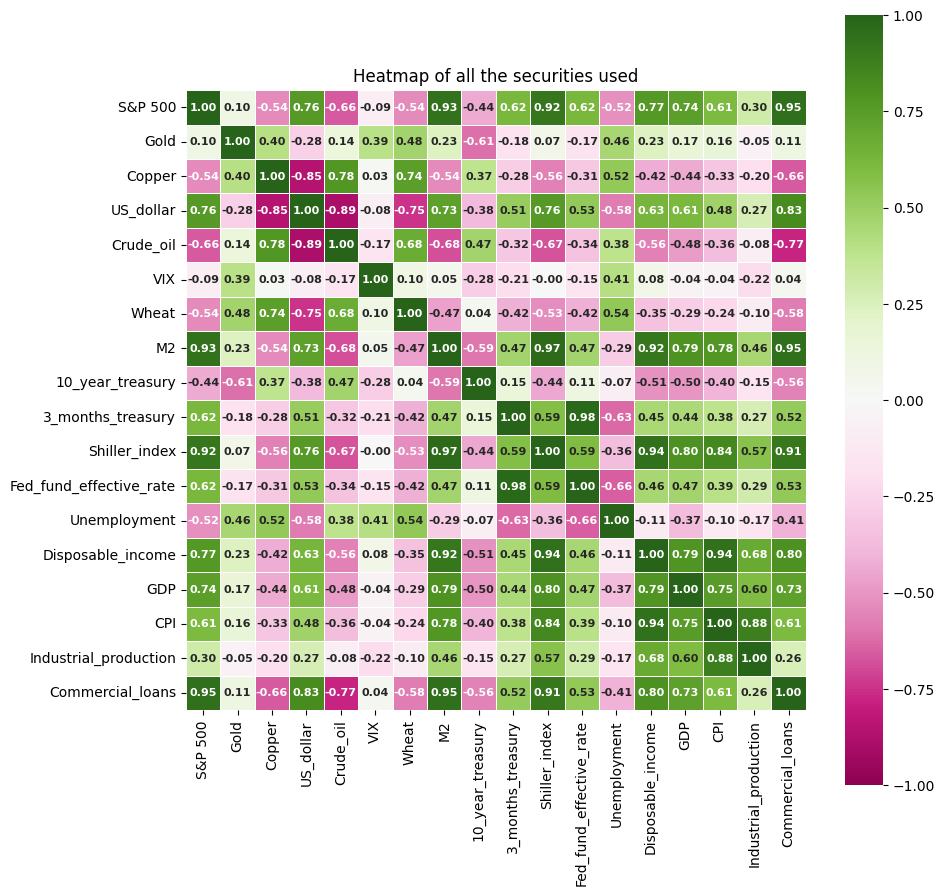

In [10]:
# Create a heatmap to show the correlation between features
plt.figure(figsize = (10, 10))
sns.heatmap(classifier_df.T.corr(),
            annot = True,
            fmt = '.2f',
            cmap = 'PiYG',
            linewidths = .5,
            square = True,
            annot_kws = {'fontsize':8, 'fontweight': 'bold'},
            vmin = -1,
            vmax = 1)
plt.title('Heatmap of all the securities used')

## 2. Model 1. Creating regular deep neural network to predict the S&P 500 price

In [37]:
nn_df = master_df.copy()
nn_df = technical_indicators(nn_df)

In [38]:
### Only run this code if using the MC simulation. Below features were not working with MC simulation because they have negative values

lst = ['ewma_12', 'ewma_26', 'MACD_signal', '3_months_treasury']
nn_df.drop(lst, axis = 1, inplace = True)

In [39]:
# Set target feature, drop unnecessary features and shift the train dataframe so that we are using yesterday's values to predict today's price.

y_nn = nn_df[['Close']]
X_nn = nn_df
X_nn.drop(['Open', 'High', 'Low', 'Adj Close'], axis = 1, inplace = True)

X_nn = X_nn.shift().dropna()
y_nn = y_nn[1:]

# Set train and test length. If train_percentage is 0.8 (80%), then test percentage is 20%
end_period, val_period = train_test_split_ts(X_nn, 0.8, 0.12)

# Divide data to train and test data
X_nn_train = X_nn[0:end_period]
X_nn_val = X_nn[end_period:val_period]
X_nn_test = X_nn[val_period:]

y_nn_train = y_nn[:end_period]
y_nn_val = y_nn[end_period:val_period]
y_nn_test = y_nn[val_period:]





In [40]:
# Standardize the train, test, and simulated data

nn_scaler = StandardScaler()
nn_scaler.fit(X_nn_train)

X_nn_train_scaled = pd.DataFrame(nn_scaler.transform(X_nn_train), index = X_nn_train.index)
X_nn_val_scaled = pd.DataFrame(nn_scaler.transform(X_nn_val), index = X_nn_val.index)
X_nn_test_scaled = pd.DataFrame(nn_scaler.transform(X_nn_test), index = X_nn_test.index)


In [41]:
# Model 1. Deep neural network

# Set the parameters
epochs = 120
es_min_delta = 500
es_patience = 30
lr_factor = 0.9
lr_patience = 60
lr_min_lr = 0.00001




model = tf.keras.models.Sequential([
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(512, activation='relu', kernel_initializer = tf.keras.initializers.HeNormal()),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(1, activation='linear'),


])

model.compile(loss = 'mean_squared_error', optimizer = 'adam', metrics = ['mae'])

'''
early_stopping = EarlyStopping(
    monitor ='loss',
    min_delta = es_min_delta,
    patience = es_patience,
    verbose = 1,
    mode = 'min',
    restore_best_weights = True
)
'''



lr_reduce = ReduceLROnPlateau(monitor = 'val_loss',
                              factor = lr_factor,
                              patience = lr_patience,
                              min_lr = lr_min_lr,
                              verbose = 1)


history = model.fit(X_nn_train_scaled, y_nn_train, epochs = epochs, validation_data = (X_nn_val_scaled, y_nn_val), verbose = 2, callbacks = [lr_reduce])
model.summary()

Epoch 1/120
68/68 - 14s - loss: 3689194.5000 - mae: 1858.6080 - val_loss: 7788914.0000 - val_mae: 2784.0161 - lr: 0.0010 - 14s/epoch - 210ms/step
Epoch 2/120
68/68 - 1s - loss: 3647308.2500 - mae: 1853.8844 - val_loss: 7659060.5000 - val_mae: 2760.6934 - lr: 0.0010 - 1s/epoch - 22ms/step
Epoch 3/120
68/68 - 1s - loss: 3586735.5000 - mae: 1844.6395 - val_loss: 6914564.5000 - val_mae: 2623.2397 - lr: 0.0010 - 1s/epoch - 17ms/step
Epoch 4/120
68/68 - 1s - loss: 3504746.7500 - mae: 1830.4240 - val_loss: 6904569.0000 - val_mae: 2620.4287 - lr: 0.0010 - 1s/epoch - 17ms/step
Epoch 5/120
68/68 - 1s - loss: 3405576.2500 - mae: 1811.0972 - val_loss: 5805936.5000 - val_mae: 2403.7976 - lr: 0.0010 - 1s/epoch - 17ms/step
Epoch 6/120
68/68 - 1s - loss: 3288513.5000 - mae: 1786.5486 - val_loss: 5044079.0000 - val_mae: 2241.0796 - lr: 0.0010 - 1s/epoch - 17ms/step
Epoch 7/120
68/68 - 2s - loss: 3158025.2500 - mae: 1757.1534 - val_loss: 2933899.5000 - val_mae: 1710.4899 - lr: 0.0010 - 2s/epoch - 24ms/s

7/7 [==============================] - 0s 7ms/step - loss: 78353.8516 - mae: 267.6060


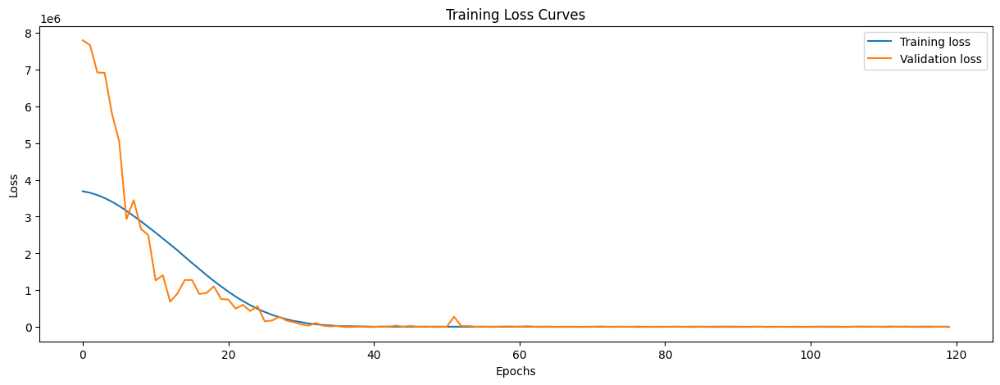

In [42]:
# Evaluate the model
test_loss = model.evaluate(X_nn_test_scaled, y_nn_test)

# Plotting the training and validation loss
train_loss = history.history['loss']
val_loss = history.history['val_loss']


# Loss plot
plt.figure(figsize = (15, 5))
plt.plot(train_loss, label='Training loss')
plt.plot(val_loss, label = 'Validation loss')
plt.title('Training Loss Curves')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

7/7 [==============================] - 0s 6ms/step


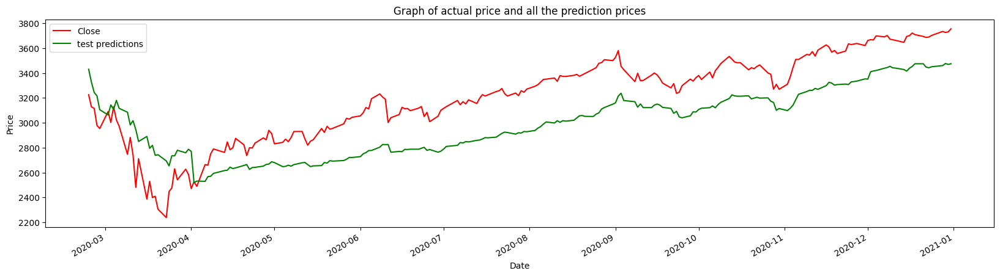

In [43]:
# Predictions using X test data only
y_predictions = pd.DataFrame(model.predict(X_nn_test_scaled), index = y_nn_test.index, columns = ['test predictions'])
result_df = pd.concat([y_nn_test, y_predictions], axis = 1)


# Plot the actual data and prediction data
plt.figure(figsize = (20,5))
result_df['Close'].plot(color = 'r')
result_df['test predictions'].plot(color = 'g')
plt.title('Graph of actual price and all the prediction prices')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()

7/7 [==============================] - 0s 9ms/step


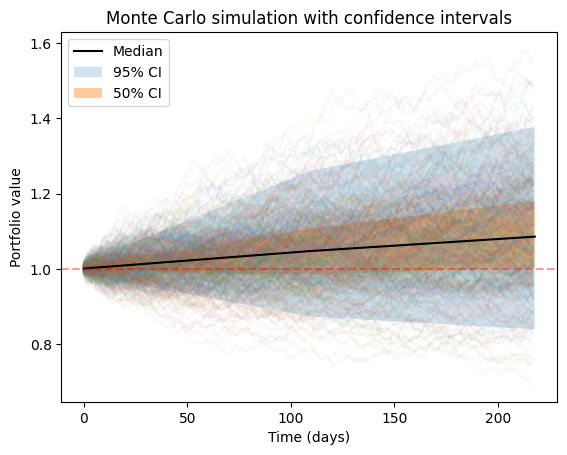

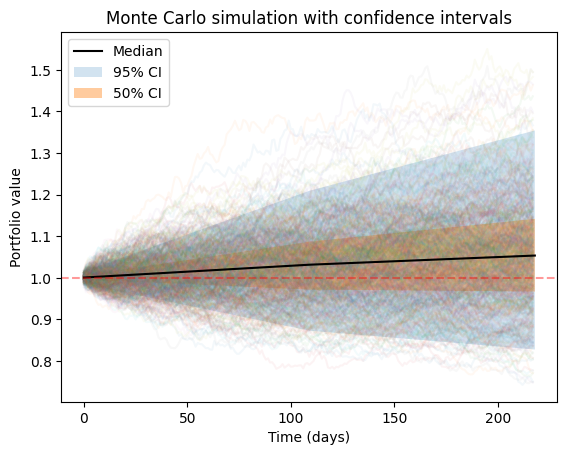

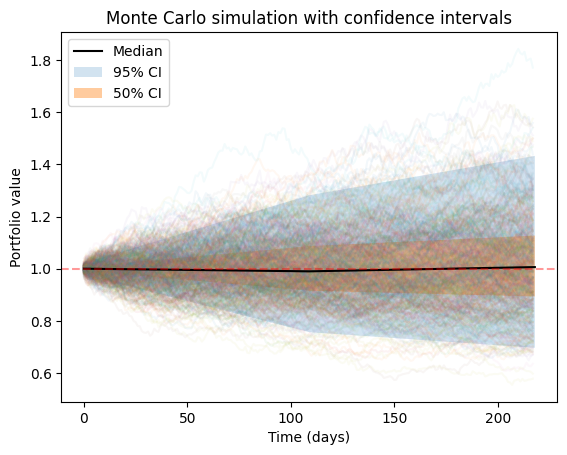

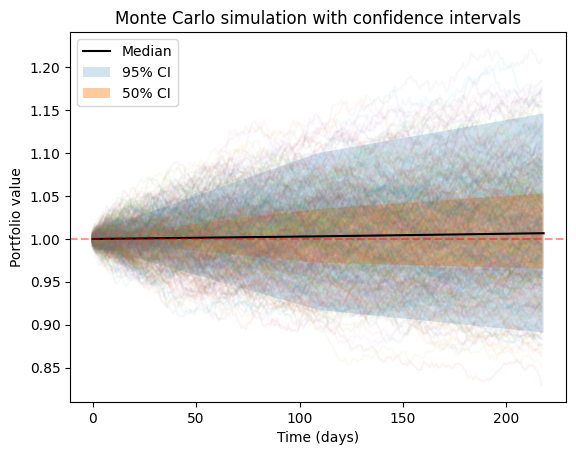

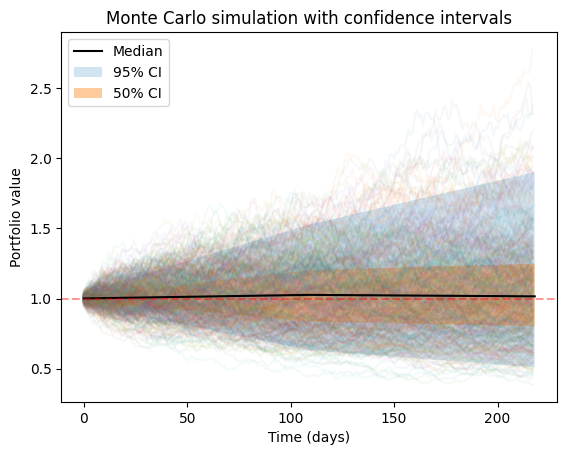

...

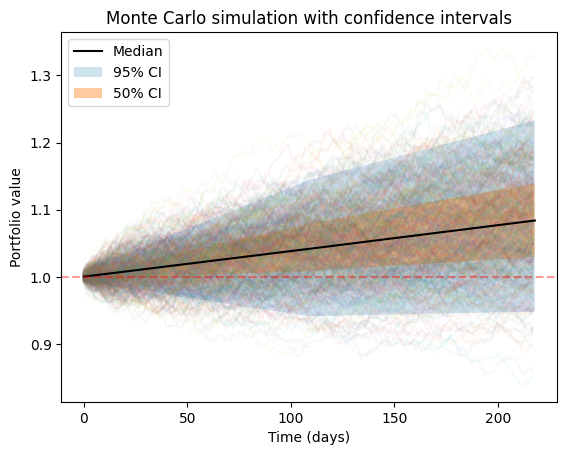

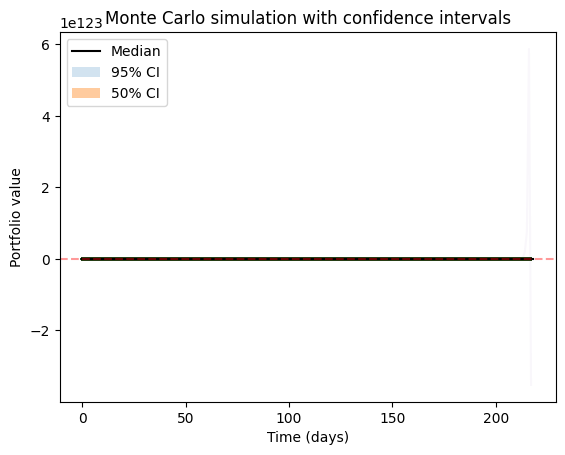

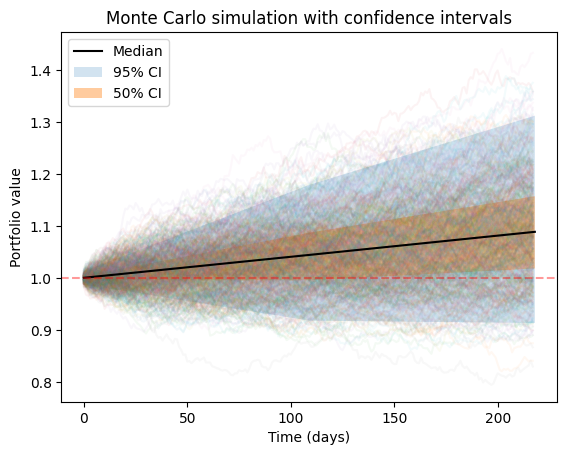

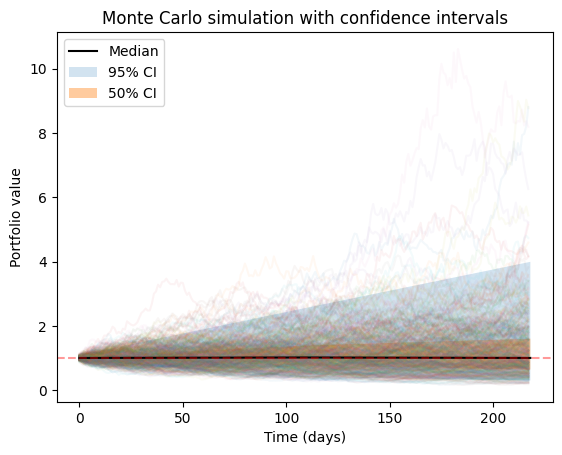

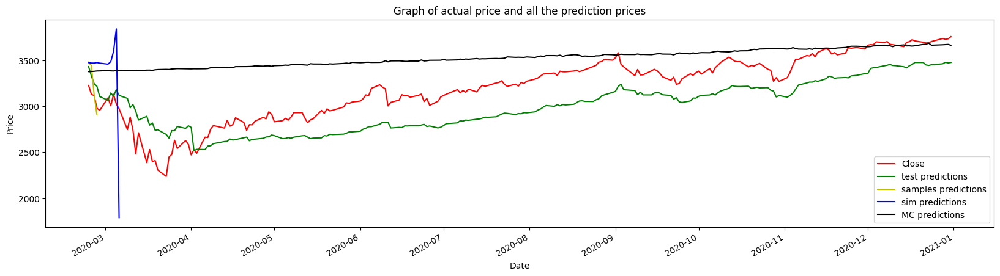

In [44]:
### Run this onlt if want to see the MC simulation results

# Create simulation datas
nn_sim_df, nn_sim_samples_df = sim_df_creator(pd.concat([X_nn_train, X_nn_val], axis = 0), X_nn_test, 4)

# Scale the simulated data
sim_df_scaled = pd.DataFrame(nn_scaler.transform(nn_sim_df), index = nn_sim_df.index)
samples_df_scaled = pd.DataFrame(nn_scaler.transform(nn_sim_samples_df), index = nn_sim_samples_df.index)

# Predicting
y_predictions = pd.DataFrame(model.predict(X_nn_test_scaled), index = y_nn_test.index, columns = ['test predictions'])
sim_predictions = pd.DataFrame(model.predict(sim_df_scaled), index = y_nn_test.index, columns = ['sim predictions'])
sim_samples_predictions = pd.DataFrame(model.predict(samples_df_scaled), index = y_nn_test.index, columns = ['samples predictions'])
monte_carlo_predictions = nn_sim_df[['Close']]
monte_carlo_predictions.columns = ['MC predictions']
result_df = pd.concat([y_nn_test, y_predictions, sim_predictions, sim_samples_predictions, monte_carlo_predictions], axis = 1)
#predictions = pd.concat([y_2_test, predictions], axis = 1)


# Plot the actual data and prediction data
plt.figure(figsize = (20,5))
result_df['Close'].plot(color = 'r')
result_df['test predictions'].plot(color = 'g')
result_df['samples predictions'].iloc[:4].plot(color = 'y')
result_df['sim predictions'].iloc[:10].plot(color = 'b')
result_df['MC predictions'].plot(color = 'k')
plt.title('Graph of actual price and all the prediction prices')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()

## 3. LSTM price prediction using previous S&P 500 data alone

In [19]:
single_lstm_df = create_dataframe(stock = '^GSPC', start = '2010-01-01', end = '2021-01-01')

# Extract only the close price of the stock
single_lstm_df = single_lstm_df[['Close']]
single_lstm_df.columns = ['S&P 500']

In [20]:
# Set the length of one train data
time_steps = 70
end_period, val_period = train_test_split_ts(single_lstm_df, 0.8, 0.12)


# Scale the data
lstm_scaler = StandardScaler()
scaled_lstm_df = pd.DataFrame(lstm_scaler.fit_transform(single_lstm_df), index = single_lstm_df.index)

# Save time index for the future use
time_index = scaled_lstm_df.index

# Create train and test data to feed into LSTM model
single_lstm_X, single_lstm_Y = [], []
for i in range(len(scaled_lstm_df) - time_steps):
    single_lstm_X.append(scaled_lstm_df.iloc[i:(i + time_steps)])
    single_lstm_Y.append(scaled_lstm_df.iloc[i + time_steps, 0])

# Change to numpy array format to feed into the LSTM model
single_lstm_X, single_lstm_Y = np.array(single_lstm_X), np.array(single_lstm_Y)

# Divide them to train and test data
x_train = single_lstm_X[0:end_period]
x_val = single_lstm_X[end_period:val_period]
x_test = single_lstm_X[val_period:]
y_train = single_lstm_Y[0:end_period]
y_val = single_lstm_Y[end_period:val_period]
y_test = single_lstm_Y[val_period:]

In [21]:
# LSTM model using price data

# Some key parameters to tune
batch_size = 16
epochs = 25
es_min_delta = 0.0008
es_patience = 30
lr_factor = 0.6
lr_patience = 3
lr_min_lr = 0.00001


single_lstm_model = Sequential([
    tf.keras.layers.LSTM(128, return_sequences = True, input_shape=(x_train.shape[1], 1)),
    tf.keras.layers.LayerNormalization(axis=-1),
    #tf.keras.layers.LSTM(64, return_sequences = True),
    #tf.keras.layers.LayerNormalization(axis=-1),
    tf.keras.layers.LSTM(64, return_sequences = False),
    #tf.keras.layers.Dense(32, activation = 'relu'),
    #tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(32, activation = 'relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(1)
]
)

single_lstm_model.compile(loss='mean_squared_error', optimizer=AdamW(0.001))

'''
early_stopping = EarlyStopping(
    monitor ='loss',
    min_delta = es_min_delta,
    patience = es_patience,
    verbose = 1,
    mode = 'min',
    restore_best_weights = True
)
'''


lr_reduce = ReduceLROnPlateau(monitor = 'val_loss',
                              factor = lr_factor,
                              patience = lr_patience,
                              min_lr = lr_min_lr,
                              verbose = 1)

single_lstm_model_history = single_lstm_model.fit(x_train, y_train, batch_size = batch_size, validation_data = (x_val, y_val), epochs = epochs, verbose = 2, callbacks = [lr_reduce])
single_lstm_model.summary()

Epoch 1/25
139/139 - 19s - loss: 0.0960 - val_loss: 0.6306 - lr: 0.0010 - 19s/epoch - 133ms/step
Epoch 2/25
139/139 - 13s - loss: 0.0519 - val_loss: 0.4345 - lr: 0.0010 - 13s/epoch - 91ms/step
Epoch 3/25
139/139 - 13s - loss: 0.0465 - val_loss: 0.2694 - lr: 0.0010 - 13s/epoch - 90ms/step
Epoch 4/25
139/139 - 13s - loss: 0.0526 - val_loss: 0.0524 - lr: 0.0010 - 13s/epoch - 91ms/step
Epoch 5/25
139/139 - 14s - loss: 0.0497 - val_loss: 0.0707 - lr: 0.0010 - 14s/epoch - 99ms/step
Epoch 6/25
139/139 - 13s - loss: 0.0531 - val_loss: 0.1559 - lr: 0.0010 - 13s/epoch - 90ms/step
Epoch 7/25
139/139 - 13s - loss: 0.0491 - val_loss: 0.0218 - lr: 0.0010 - 13s/epoch - 92ms/step
Epoch 8/25
139/139 - 13s - loss: 0.0472 - val_loss: 0.1399 - lr: 0.0010 - 13s/epoch - 91ms/step
Epoch 9/25
139/139 - 13s - loss: 0.0554 - val_loss: 0.0985 - lr: 0.0010 - 13s/epoch - 91ms/step
Epoch 10/25

Epoch 10: ReduceLROnPlateau reducing learning rate to 0.0006000000284984708.
139/139 - 13s - loss: 0.0533 - val_loss: 0.02

5/5 [==============================] - 0s 48ms/step - loss: 0.0785


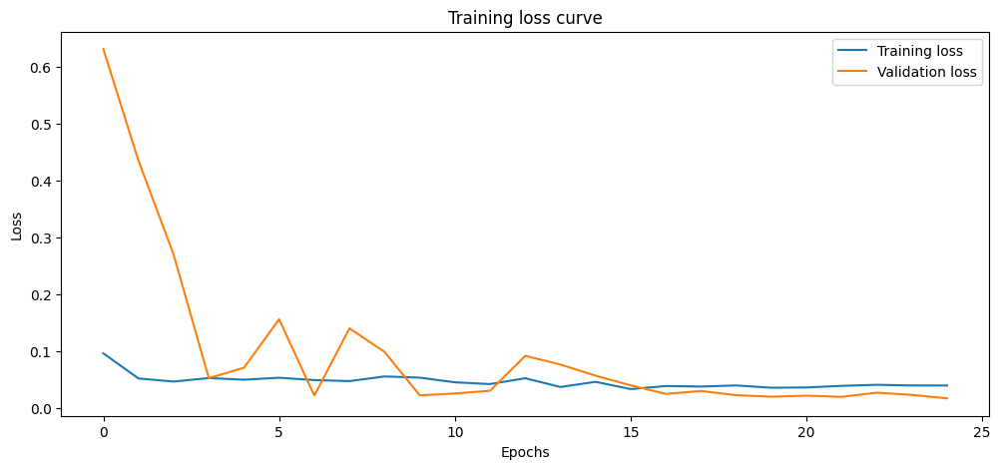

In [22]:
# Create loss curve
test_loss = single_lstm_model.evaluate(x_test, y_test)

single_lstm_model_train_loss = single_lstm_model_history.history['loss']
single_lstm_model_val_loss = single_lstm_model_history.history['val_loss']

plt.figure(figsize = [12,5])
plt.plot(single_lstm_model_train_loss, label = 'Training loss')
plt.plot(single_lstm_model_val_loss, label = 'Validation loss')
plt.title('Training loss curve')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

In [23]:
# Predictions using test data
single_lstm_model_predictions = single_lstm_model.predict(x_test)
single_lstm_model_predictions = lstm_scaler.inverse_transform(single_lstm_model_predictions)

# Prediction without using test data
# Basically, first prediction is made, then the first prediction is concatenated to the next test data, and the very first data in the test data is dropped to create a new test data
# The prediction is continued for the duration of test period

my_predictions = []
test_set = x_test[0:1]
for i in range(x_test.shape[0]):
  predict = single_lstm_model.predict(test_set)
  converted_predict = lstm_scaler.inverse_transform(predict)
  my_predictions.append(converted_predict[0][0])
  test_set = np.concatenate((test_set[:, 1:, :], predict.reshape(1, 1, 1)), axis = 1)

1/1 [==============================] - 0s 38ms/step


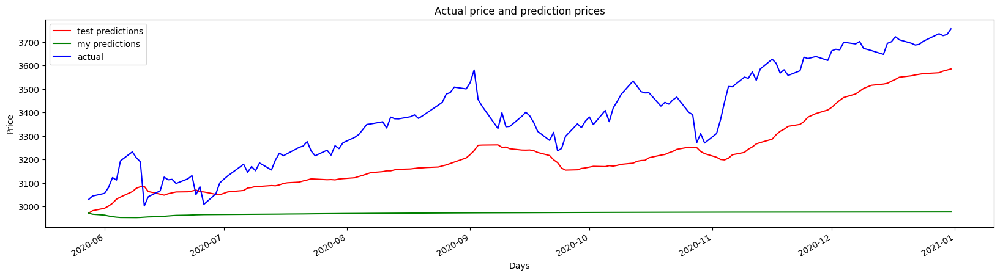

In [24]:
# Put all the prediction data into a single data frame
test_predictions = pd.DataFrame(single_lstm_model_predictions, columns = ['test predictions'])
my_predictions = pd.DataFrame(my_predictions, columns = ['my predictions'])
actual_data = pd.DataFrame(lstm_scaler.inverse_transform(y_test.reshape(-1,1)), columns = ['actual'])
single_lstm_predictions_df = pd.concat([test_predictions, my_predictions, actual_data], axis = 1)
single_lstm_predictions_df.index = time_index[val_period + time_steps:]

# Plotting actual and prediction data
plt.figure(figsize = (20,5))
single_lstm_predictions_df['test predictions'].plot(color = 'r')
single_lstm_predictions_df['my predictions'].plot(color = 'g')
single_lstm_predictions_df['actual'].plot(color = 'b')
plt.title('Actual price and prediction prices')
plt.xlabel('Days')
plt.ylabel('Price')
plt.legend()

## 3. LSTM to predict future price using other features

In [25]:
multi_lstm_df = master_df.copy()

# Create all the necessary features and drop all the unnecessary features

multi_lstm_df = technical_indicators(multi_lstm_df)
multi_lstm_df.drop(['Open', 'High', 'Low', 'Adj Close'], axis = 1, inplace = True)
multi_lstm_df.dropna(inplace = True)

# Define target variable

multi_lstm_target = multi_lstm_df[['Close']]

In [26]:
### Run this code if you want to do MC simulation predictions too

lst = ['ewma_12', 'ewma_26', 'MACD_signal', '3_months_treasury']
multi_lstm_df.drop(lst, axis = 1, inplace = True)

In [27]:
# Enter necessary parameters
end_period, _ = train_test_split_ts(multi_lstm_df, 0.85)
time_steps = 60

# Divide to train and test data. Then fit_transform the train data, and transform the test and simulated data.

multi_lstm_df_1 = multi_lstm_df.iloc[:end_period,:]
multi_lstm_df_2 = multi_lstm_df.iloc[end_period:,:]

multi_lstm_scaler = StandardScaler()
scaled_df_1 = pd.DataFrame(multi_lstm_scaler.fit_transform(multi_lstm_df_1), index = multi_lstm_df_1.index)
scaled_df_2 = pd.DataFrame(multi_lstm_scaler.transform(multi_lstm_df_2), index = multi_lstm_df_2.index)
scaled_multi_lstm_df = pd.concat([scaled_df_1, scaled_df_2], axis = 0)


# Divide to train and test target data. Then fit_transform the train target data, and transform the test target data.
# The LSTM model worked better with scaled data, therefore scaling the target data as well.
multi_lstm_target_1 = multi_lstm_target.iloc[:end_period,:]
multi_lstm_target_2 = multi_lstm_target.iloc[end_period:,:]

multi_lstm_target_scaler = StandardScaler()
scaled_target_1 = pd.DataFrame(multi_lstm_target_scaler.fit_transform(multi_lstm_target_1), index = multi_lstm_target_1.index)
scaled_target_2 = pd.DataFrame(multi_lstm_target_scaler.transform(multi_lstm_target_2), index = multi_lstm_target_2.index)
scaled_multi_lstm_target = pd.concat([scaled_target_1, scaled_target_2], axis = 0)
scaled_multi_lstm_target.columns = ['Price']

# Save the index data for future use
test_index = scaled_multi_lstm_target.index

# Slicing data to align with predicting data
scaled_multi_lstm_df = scaled_multi_lstm_df[:-1]


scaled_multi_lstm_target['Target'] = scaled_multi_lstm_target['Price'].shift(-1)
scaled_multi_lstm_target.drop(['Price'], inplace = True, axis = 1)
scaled_multi_lstm_target.dropna(inplace = True)


# Creating train and test data
X_multi_lstm, Y_multi_lstm = [], []
for i in range(len(scaled_multi_lstm_df) - time_steps):
    X_multi_lstm.append(scaled_multi_lstm_df.iloc[i:(i + time_steps)])
    Y_multi_lstm.append(scaled_multi_lstm_target.iloc[i + time_steps,0])

X_multi_lstm, Y_multi_lstm = np.array(X_multi_lstm), np.array(Y_multi_lstm)

x_3_train = X_multi_lstm[0:end_period]
x_3_test = X_multi_lstm[end_period:]
y_3_train = Y_multi_lstm[0:end_period]
y_3_test = Y_multi_lstm[end_period:]

In [28]:
# Model 3. LSTM using all the features selected

# List some parameters to tune
n_features = scaled_multi_lstm_df.shape[1]
batch_size = 32
epochs = 6
es_min_delta = 0.0008
es_patience = 20

# Construct model
multi_lstm_model = Sequential([
    tf.keras.layers.LSTM(128, return_sequences = True, input_shape=(time_steps, n_features), activation = 'relu'),
    #tf.keras.layers.LayerNormalization(axis=-1),
    tf.keras.layers.LSTM(128, return_sequences = True),
    #tf.keras.layers.LayerNormalization(axis=-1),
    tf.keras.layers.LSTM(64, return_sequences = False),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(32, activation = 'relu'),
    #tf.keras.layers.BatchNormalization(),
    #tf.keras.layers.Dense(32, activation = 'relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(1)
]
)

# Compile and fit the model
multi_lstm_model.compile(optimizer = AdamW(0.00005), loss='mean_squared_error')

early_stopping = EarlyStopping(
    monitor ='loss',
    min_delta = es_min_delta,
    patience = es_patience,
    verbose = 1,
    mode = 'min',
    restore_best_weights = True
)

multi_lstm_model_history = multi_lstm_model.fit(x_3_train, y_3_train, epochs = epochs, batch_size = batch_size, verbose = 2, callbacks = [early_stopping])
multi_lstm_model.summary()

Epoch 1/6
73/73 - 25s - loss: 0.4919 - 25s/epoch - 337ms/step
Epoch 2/6
73/73 - 17s - loss: 0.1233 - 17s/epoch - 230ms/step
Epoch 3/6
73/73 - 18s - loss: 0.0909 - 18s/epoch - 252ms/step
Epoch 4/6
73/73 - 17s - loss: 0.0857 - 17s/epoch - 227ms/step
Epoch 5/6
73/73 - 18s - loss: 0.0750 - 18s/epoch - 244ms/step
Epoch 6/6
73/73 - 18s - loss: 0.0641 - 18s/epoch - 242ms/step
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_2 (LSTM)               (None, 60, 128)           80384     
                                                                 
 lstm_3 (LSTM)               (None, 60, 128)           131584    
                                                                 
 lstm_4 (LSTM)               (None, 64)                49408     
                                                                 
 batch_normalization_8 (Bat  (None, 64)                256       
 chNormaliza

In [29]:
test_loss = multi_lstm_model.evaluate(x_3_test, y_3_test)

11/11 [==============================] - 2s 79ms/step - loss: 1.4244


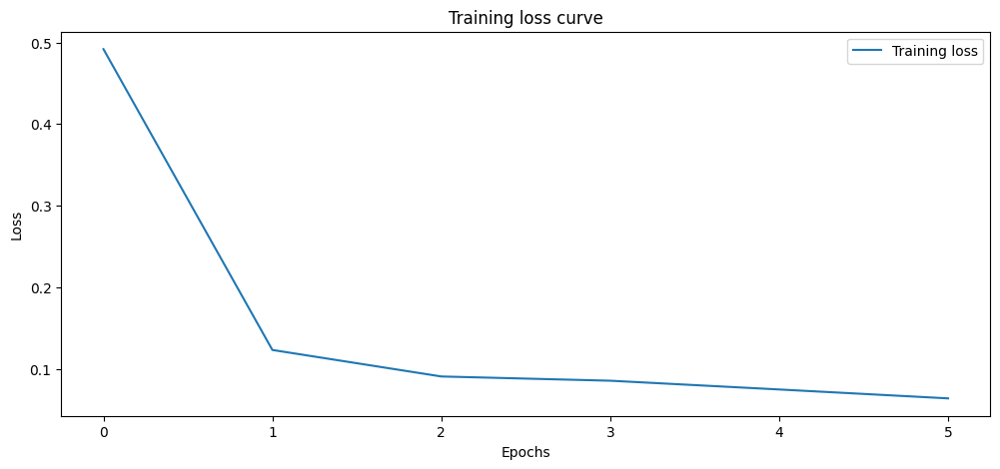

In [30]:
multi_lstm_model_train_loss = multi_lstm_model_history.history['loss']

plt.figure(figsize = [12,5])
plt.plot(multi_lstm_model_train_loss, label = 'Training loss')
plt.title('Training loss curve')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

In [31]:
predictions_model_3 = multi_lstm_model.predict(x_3_test)
predictions_model_3 = multi_lstm_target_scaler.inverse_transform(predictions_model_3)

11/11 [==============================] - 2s 77ms/step


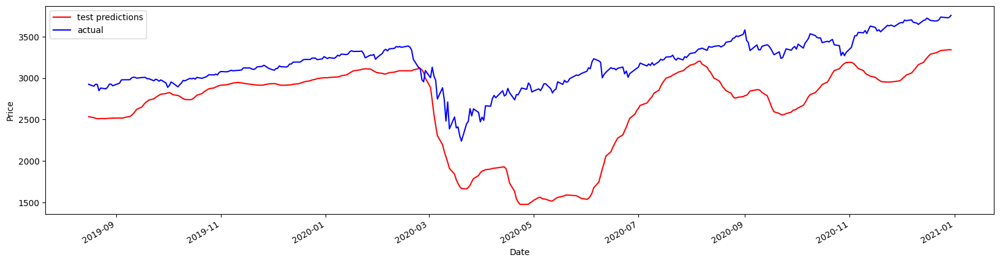

In [32]:
# Combine all the predictions into one dataframe
prediction_df = pd.DataFrame(predictions_model_3, columns = ['test predictions'])
actual_df = pd.DataFrame(multi_lstm_target_scaler.inverse_transform(y_3_test.reshape(-1,1)), columns = ['actual'])
lstm_df = pd.concat([prediction_df, actual_df], axis = 1)
lstm_df.index = test_index[end_period + time_steps:-1]

# Plot all the actual and prediction results
plt.figure(figsize = (20,5))
lstm_df['test predictions'].plot(color = 'r')
lstm_df['actual'].plot(color = 'b')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()

11/11 [==============================] - 1s 73ms/step


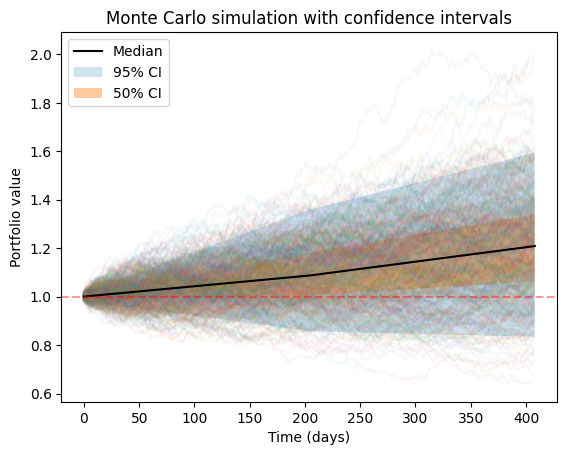

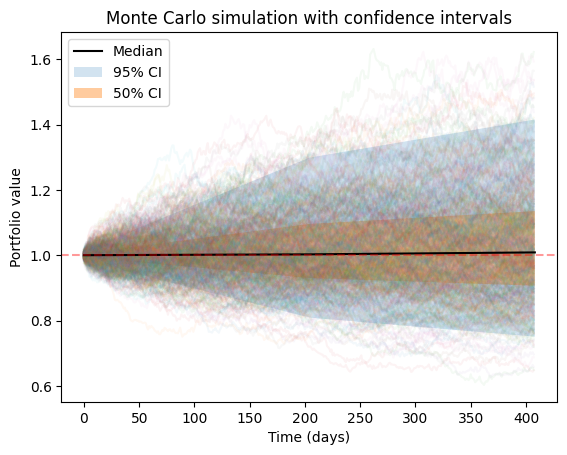

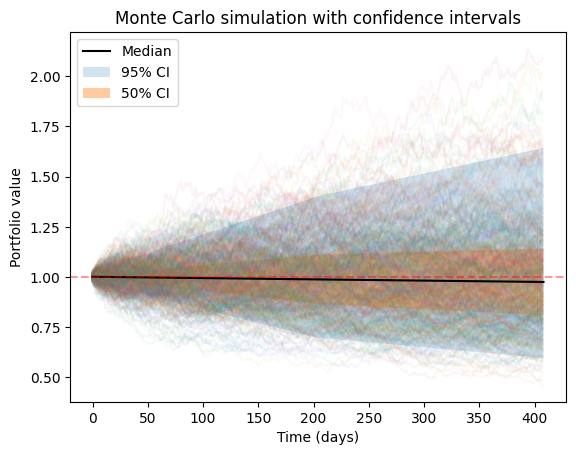

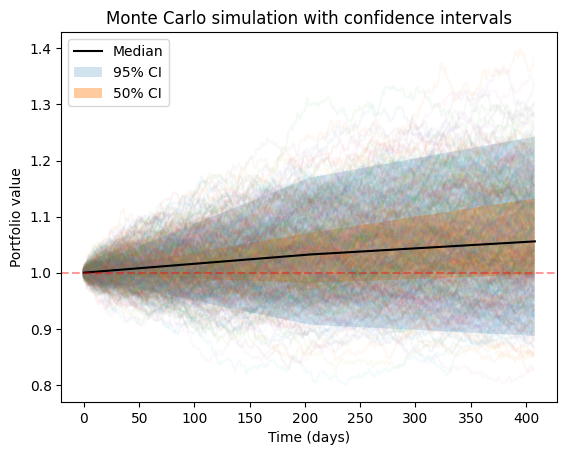

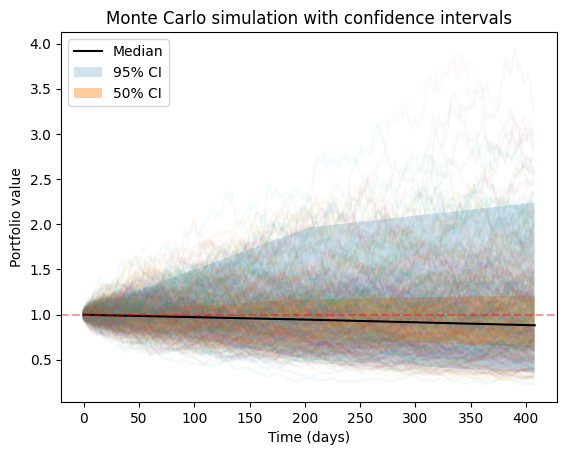

...

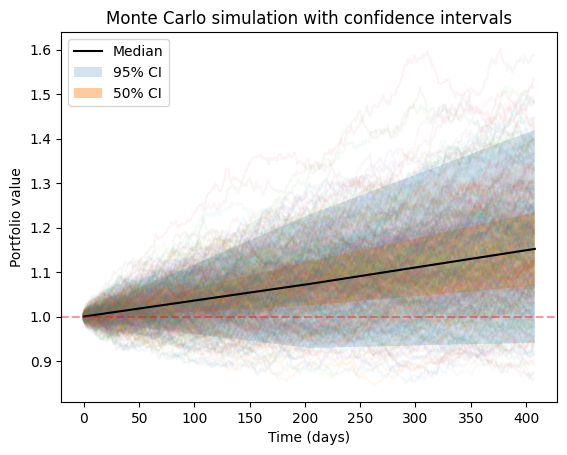

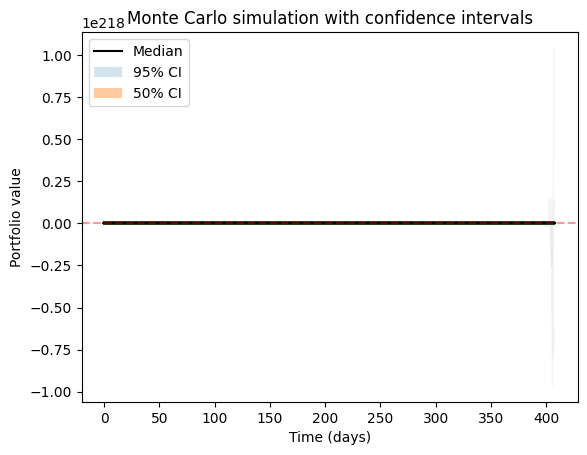

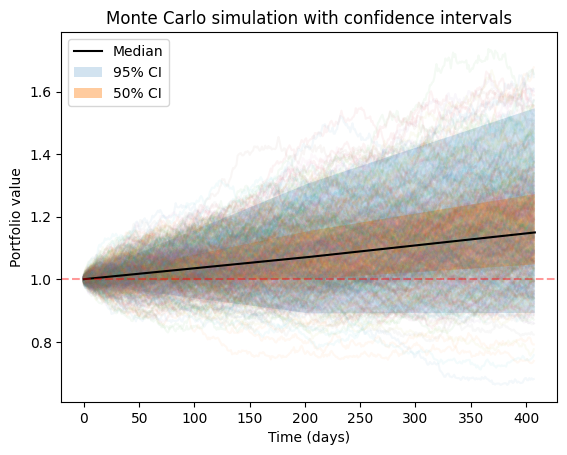

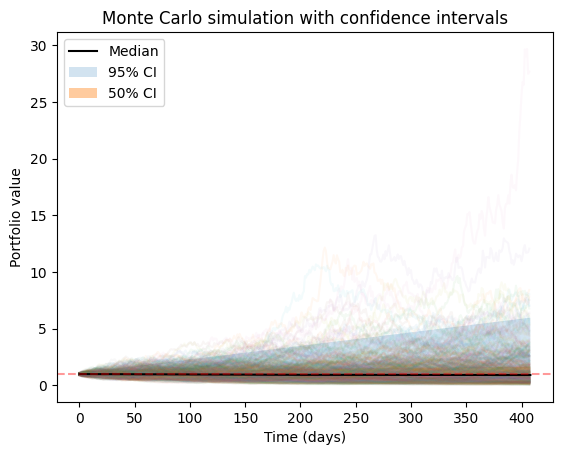

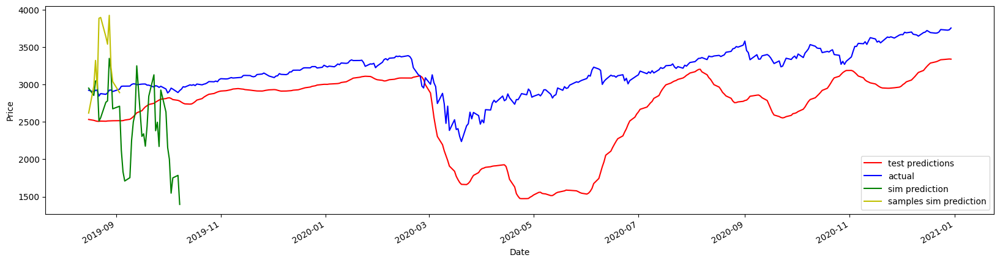

In [33]:
### Run this only if want to test MC simulation results

# Before scaling, create simulated dataframe
lstm_sim, lstm_samples_sim = sim_df_creator(multi_lstm_df_1, multi_lstm_df_2)

scaled_lstm_sim = pd.DataFrame(multi_lstm_scaler.transform(lstm_sim), index = lstm_sim.index)
scaled_lstm_samples_sim = pd.DataFrame(multi_lstm_scaler.transform(lstm_samples_sim), index = lstm_samples_sim.index)

scaled_lstm_sim = scaled_lstm_sim[:-1]
scaled_lstm_samples_sim = scaled_lstm_samples_sim[:-1]

# Create simulation test set
X_sim = []
for i in range(len(scaled_lstm_sim) - time_steps):
    X_sim.append(scaled_lstm_sim[i:(i + time_steps)])

X_sim = np.array(X_sim)

predictions_sim = multi_lstm_model.predict(X_sim)
predictions_sim = multi_lstm_target_scaler.inverse_transform(predictions_sim)

X_samples_sim = []
for i in range(len(scaled_lstm_samples_sim) - time_steps):
    X_samples_sim.append(scaled_lstm_samples_sim[i:(i + time_steps)])

X_samples_sim = np.array(X_samples_sim)

# Predict using simulated data
predictions_samples_sim = multi_lstm_model.predict(X_samples_sim)
predictions_samples_sim = multi_lstm_target_scaler.inverse_transform(predictions_samples_sim)


# Combine all the predictions into one dataframe
prediction_df = pd.DataFrame(predictions_model_3, columns = ['test predictions'])
actual_df = pd.DataFrame(multi_lstm_target_scaler.inverse_transform(y_3_test.reshape(-1,1)), columns = ['actual'])
sim_df = pd.DataFrame(predictions_sim, columns = ['sim prediction'])
samples_pred_df = pd.DataFrame(predictions_samples_sim, columns = ['samples sim prediction'])
lstm_df = pd.concat([prediction_df, actual_df, sim_df, samples_pred_df], axis = 1)
lstm_df.index = test_index[end_period + time_steps:-1]

# Plot all the actual and prediction results
plt.figure(figsize = (20,5))
lstm_df['test predictions'].plot(color = 'r')
lstm_df['actual'].plot(color = 'b')
lstm_df['sim prediction'].plot(color = 'g')
lstm_df['samples sim prediction'].plot(color = 'y')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()

## 4. Data visualizations and prediction using Meta's Prophet

In [34]:
def prophet_complete_pack(df, forecast_period = 500):
    prophet = Prophet()

    hv.extension('bokeh')
    display(df.hvplot.heatmap(x='index.day', y='index.month', C = 'Close', height=500, width=700))
    display(df.hvplot.heatmap(x='index.day', y='index.month', C = 'Volume', height=500, width=700))
    display(df.hvplot.heatmap(x='index.month', y='index.year', C = 'Volume', height=500, width=700))
    display(df['Volume'].groupby(df.index.month).mean().hvplot())

    close_df = df[['Close']].reset_index()
    close_df.columns = ['ds', 'y']
    close_df.dropna(inplace = True)
    prophet.fit(close_df)
    future_trends = prophet.make_future_dataframe(periods=forecast_period, freq='D')
    forecast = prophet.predict(future_trends)
    prophet.plot(forecast)
    forecast = forecast.set_index('ds')
    forecast[['yhat', 'yhat_lower', 'yhat_upper']]
    forecast[['yhat', 'yhat_lower', 'yhat_upper']].iloc[-forecast_period:].hvplot()
    forecast = forecast.reset_index()
    figures = prophet.plot_components(forecast)


In [35]:
snp_df = fdr.DataReader('^GSPC', start = '2009-10-01', end = '2022-12-31')

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
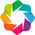

/usr/local/lib/python3.10/dist-packages/holoviews/core/util.py:1585: PanelDeprecationWarning: 'param_value_if_widget' is deprecated and will be removed in version 1.4, use 'transform_reference' instead.
  value = param_value_if_widget(value)
/usr/local/lib/python3.10/dist-packages/holoviews/core/util.py:1585: PanelDeprecationWarning: 'param_value_if_widget' is deprecated and will be removed in version 1.4, use 'transform_reference' instead.
  value = param_value_if_widget(value)
/usr/local/lib/python3.10/dist-packages/holoviews/core/util.py:1585: PanelDeprecationWarning: 'param_value_if_widget' is deprecated and will be removed in version 1.4, use 'transform_reference' instead.
  value = param_value_if_widget(value)
/usr/local/lib/python3.10/dist-packages/holoviews/core/util.py:1585: PanelDeprecationWarning: 'param_value_if_widget' is deprecated and will be removed in version 1.4, use 'transform_reference' instead.
  value = param_value_if_widget(value)
/usr/local/lib/python3.10/dist-p

:HeatMap   [index.day,index.month]   (Close)

/usr/local/lib/python3.10/dist-packages/holoviews/core/util.py:1585: PanelDeprecationWarning: 'param_value_if_widget' is deprecated and will be removed in version 1.4, use 'transform_reference' instead.
  value = param_value_if_widget(value)
/usr/local/lib/python3.10/dist-packages/holoviews/core/util.py:1585: PanelDeprecationWarning: 'param_value_if_widget' is deprecated and will be removed in version 1.4, use 'transform_reference' instead.
  value = param_value_if_widget(value)
/usr/local/lib/python3.10/dist-packages/holoviews/core/util.py:1585: PanelDeprecationWarning: 'param_value_if_widget' is deprecated and will be removed in version 1.4, use 'transform_reference' instead.
  value = param_value_if_widget(value)
/usr/local/lib/python3.10/dist-packages/holoviews/core/util.py:1585: PanelDeprecationWarning: 'param_value_if_widget' is deprecated and will be removed in version 1.4, use 'transform_reference' instead.
  value = param_value_if_widget(value)
/usr/local/lib/python3.10/dist-p

:HeatMap   [index.day,index.month]   (Volume)

/usr/local/lib/python3.10/dist-packages/holoviews/core/util.py:1585: PanelDeprecationWarning: 'param_value_if_widget' is deprecated and will be removed in version 1.4, use 'transform_reference' instead.
  value = param_value_if_widget(value)
/usr/local/lib/python3.10/dist-packages/holoviews/core/util.py:1585: PanelDeprecationWarning: 'param_value_if_widget' is deprecated and will be removed in version 1.4, use 'transform_reference' instead.
  value = param_value_if_widget(value)
/usr/local/lib/python3.10/dist-packages/holoviews/core/util.py:1585: PanelDeprecationWarning: 'param_value_if_widget' is deprecated and will be removed in version 1.4, use 'transform_reference' instead.
  value = param_value_if_widget(value)
/usr/local/lib/python3.10/dist-packages/holoviews/core/util.py:1585: PanelDeprecationWarning: 'param_value_if_widget' is deprecated and will be removed in version 1.4, use 'transform_reference' instead.
  value = param_value_if_widget(value)
/usr/local/lib/python3.10/dist-p

:HeatMap   [index.month,index.year]   (Volume)

:Curve   [Date]   (Volume)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpk7729gjw/idkx43zl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpk7729gjw/n1kptnku.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=78844', 'data', 'file=/tmp/tmpk7729gjw/idkx43zl.json', 'init=/tmp/tmpk7729gjw/n1kptnku.json', 'output', 'file=/tmp/tmpk7729gjw/prophet_modeldnx1dpta/prophet_model-20240322010204.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
01:02:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
01:02:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


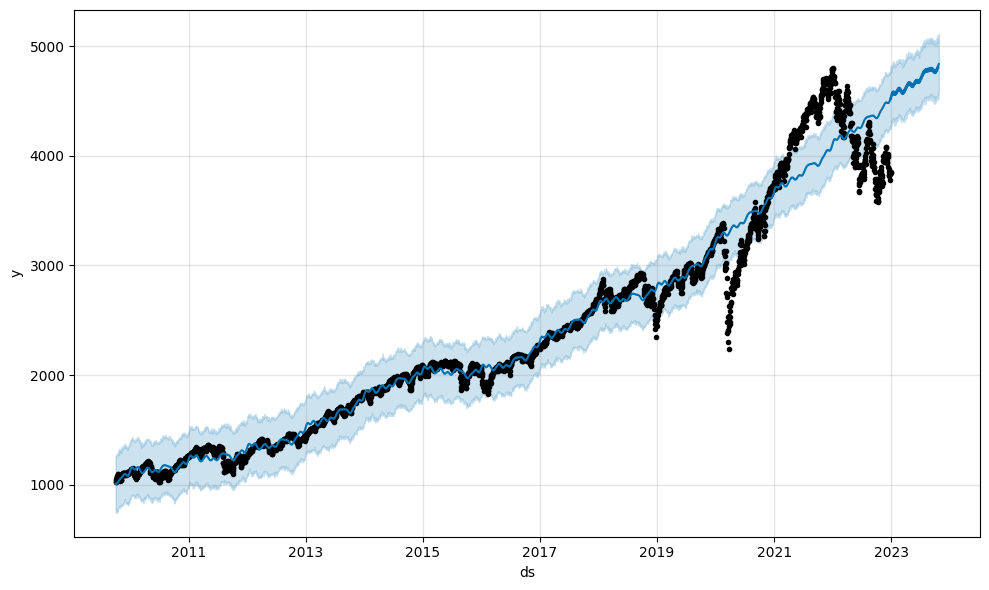

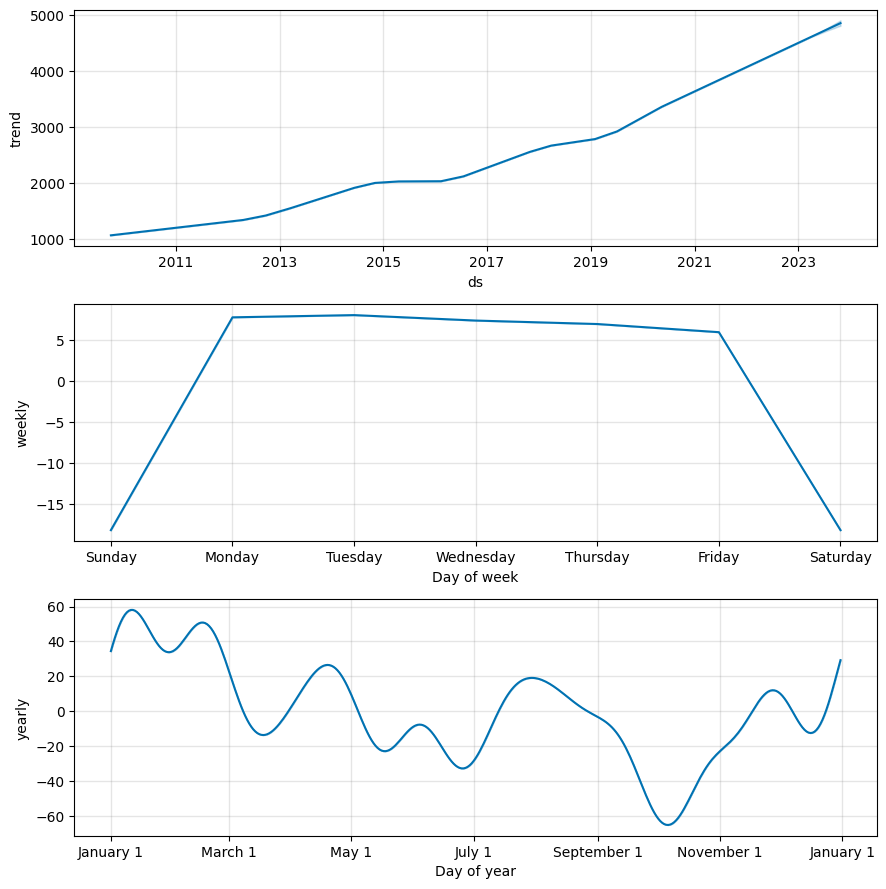

In [36]:
hv.extension('bokeh')
prophet_complete_pack(snp_df, forecast_period = 300)